In [1]:
using Revise
using LilGuys
using CairoMakie, Arya
LP = LilGuys.Plots

LilGuys.Plots

In [2]:
using Printf

In [3]:
import DataFrames: DataFrame, rename!

In [4]:
models_dir = "/astro/dboyea/sculptor/"

"/astro/dboyea/sculptor/"

In [5]:
function load_profile(name) 
    path = joinpath(models_dir, "$name/out/profiles.hdf5")
    profiles = LilGuys.read_structs_from_hdf5(path, LilGuys.MassProfile3D)
    idx = parse.(Int, first.(profiles))
    profiles = last.(profiles)
    return profiles[sortperm(idx)]
    
end

load_profile (generic function with 1 method)

In [6]:
t_max_host = 316 # computed with agama at peri=50.95 
M_max_host = 52.437
r_peri = 50.95
ρ_peri = M_max_host / (4π/3 * r_peri^3)

9.46491379338667e-5

In [7]:
halo = LilGuys.load_profile("/astro/dboyea/sculptor/isolation/1e6/fiducial/halo.toml")

LilGuys.TruncNFW(0.29, 2.76, 276.0, 13.086635052895323)

In [8]:
Base.@kwdef struct NFWZeno <: LilGuys.SphericalProfile
	m_a = LilGuys.A_NFW(1)
	a = 1
	b = 64
	taper = :exp
end


function calc_ρ_nfw(halo, r)
	return halo.m_a / (4π * LilGuys.A_NFW(1) * r * (halo.a + r)^2)
end

# ╔═╡ dd47be7c-99dc-4f66-8bb4-33f827438a26
function calc_ρ_e(halo, r)
	ρ_b = calc_ρ_nfw(halo, halo.b)

	b = halo.b
	γ = b/(b+halo.a) - 1/2
	return ρ_b * (b/r)^2 * exp(-2γ * (r/b - 1))
end

# ╔═╡ 4cae6065-6c19-4667-b5ae-87ed49958e70
function LilGuys.calc_ρ(halo::NFWZeno, r)
	if r < halo.b
		return calc_ρ_nfw(halo, r)
	else
		return calc_ρ_e(halo, r)
	end
end

# Plotting functions

In [78]:
function compare_densities(profiles)
    fig = Figure()
    ax = LP.rho_axis(fig[1, 1])
    ax.limits=(-2, 3, -12, 0)

    log_r = LinRange(-2, 3, 1000)
    ρ = calc_ρ.(halo, 10 .^ log_r)
    lines!(log_r, log10.(ρ), color=:black, linestyle=:dash)
    
    for i in eachindex(profiles)
        label, profs = profiles[i]
        profile = profs[1]
        lines!(profile.log_r, log10.(profile.rho),
            linestyle=:dot,
            color=COLORS[i]
        )
    
        profile = profs[end]
        lines!(profile.log_r, log10.(profile.rho), 
            color=COLORS[i],
            label=label
        )    
    end
    
    axislegend()

    ax_res = LP.rho_axis(fig[2, 1])
    ax_res.ylabel = L"(\rho-\rho_\textrm{exp}) / \rho_\textrm{exp}"
    ax_res.limits = (-2, 3, -1, 1)

    for i in eachindex(profiles)
        profile = profiles[i].second[end]

        x = profile.log_r
        y_exp = calc_ρ.(halo, 10 .^ x)
        dy = profile.rho .- y_exp

        res = dy ./ y_exp
        res_err = profile.rho_err ./ y_exp
        lines!(x, res, color=COLORS[i])
        errorbars!(x, res, res_err, color=COLORS[i])
    end
    hlines!(0, color=:black)


	linkxaxes!(ax, ax_res, )
	rowsize!(fig.layout, 2, Auto(0.3))
	hidexdecorations!(ax, grid=false)
    
    fig

end

compare_densities (generic function with 1 method)

In [10]:
function compare_vcirc1(profile, halo=halo; res_limits=0.1)
    xlims = (-2, 3)
    
    fig = Figure()
    ax = Axis(fig[1, 1],
        xlabel=LP.log_r_label,
        ylabel=L"$\log\;v_\textrm{circ}$ / km\,s$^{-1}$",
        limits=(xlims[1], xlims[2], 0, 1.6),
    )
    
    lines!(profile.log_r, log10.(profile.v_circ * V2KMS), label="model",
    )

    x = LinRange(xlims[1], xlims[2], 1000)
    y = calc_v_circ.(halo, 10 .^ x)
    lines!(x, log10.(y * V2KMS), linestyle=:dash, color=:black, label="analytic")

    axislegend(position=:rb)

    # residual

    ax_res = Axis(fig[2, 1],
        xlabel=LP.log_r_label,
        ylabel=L"\Delta\,v",
        limits=(xlims[1], xlims[2], -res_limits, res_limits),
    )
    

    x = profile.log_r_bins[2:end]
    y_exp = calc_v_circ.(halo, 10 .^ x)
    dy = profile.v_circ .- y_exp


    res = dy ./ y_exp
    res_err = profile.v_circ_err  ./ y_exp
    lines!(x, res)
    errorbars!(x, res, res_err)
    
    hlines!(0, color=:black)


	linkxaxes!(ax, ax_res, )
	rowsize!(fig.layout, 2, Auto(0.3))
	hidexdecorations!(ax, grid=false)
    
    fig
end

compare_vcirc1 (generic function with 2 methods)

In [72]:
function compare_vcirc(profiles)
    xlims = (-2, 3)
    
    fig = Figure()
    ax = Axis(fig[1, 1],
        xlabel=LP.log_r_label,
        ylabel=L"$v_\textrm{circ}$ / km\,s$^{-1}$",
        limits=(xlims[1], xlims[2], 0, 32.5),
        )
    pi = 1

    
    for i in eachindex(profiles)
        label, profs = profiles[i]
        profile = profs[1]
        lines!(profile.log_r, (profile.v_circ * V2KMS),
            linestyle=:dot,
            color=COLORS[i]
        )
        
        profile = profs[end]
        lines!(profile.log_r, (profile.v_circ* V2KMS), 
            color=COLORS[i],
            label=label
        )


    
    end

    x = LinRange(xlims[1], xlims[2], 1000)
    y = calc_v_circ.(halo, 10 .^ x)
    lines!(x, y * V2KMS, linestyle=:dash, color=:black, label="NFW")

    axislegend(position=:rb)

    # residual

    ax_res = Axis(fig[2, 1],
        xlabel=LP.log_r_label,
        ylabel=L"\Delta\,v",
        limits=(xlims[1], xlims[2], -2, 2),
    )
    
    for i in eachindex(profiles)
        label, profs = profiles[i]
        profile = profs[end]

        x = profile.log_r_bins[2:end]
        y_exp = calc_v_circ.(halo, 10 .^ x)
        dy = profile.v_circ .- y_exp


        res = dy * V2KMS
        res_err = profile.v_circ_err  * V2KMS
        lines!(x, res, color=COLORS[i])
        errorbars!(x, res, res_err, color=COLORS[i])
    end
    hlines!(0, color=:black)


	linkxaxes!(ax, ax_res, )
	rowsize!(fig.layout, 2, Auto(0.3))
	hidexdecorations!(ax, grid=false)
    
    fig
end

compare_vcirc (generic function with 1 method)

In [12]:
function compare_t_dyn(profiles, labels)
    fig = Figure()
    ax = Axis(fig[1, 1],
        xlabel=LP.log_r_label,
        ylabel=L"$\log; t_\textrm{dyn}$ / km\,s$^{-1}$",
        limits=(-2, 3, -0.5, 2),
        )
    pi = 1
    
    for i in eachindex(profiles)
        
        profile = profiles[i][1]
    
        profile = profiles[i][end]
        t = 10 .^ profile.log_r ./ (profile.v_circ)
        lines!(profile.log_r, log10.(t), 
            color=COLORS[i],
            label=labels[i]
        )
    
    
    end
    
    
    axislegend(
    )
    fig

end

compare_t_dyn (generic function with 1 method)

In [13]:
function load_cpu_use(model_dir::String)
    filename = joinpath(models_dir, model_dir, "out/cpu.csv")

    lines = readlines(filename)
    lines[1] = replace(lines[1], "MULTIPLEDOMAIN, " => "")

    data = [split(line, ", ")[1:end-1] for line in lines[2:end]]
    
    columns = split(lines[1], ", ")[1:end-1]
    columns = replace.(columns, "1"=>"", "2"=>"_TOT", "3"=>"_PERCEN")

    Ncol = length(columns)

    data = [[row[i] for row in data] for i in 1:Ncol]
    df = DataFrame(data, Symbol.(columns))

    convert_types!(df)

    return df
end

load_cpu_use (generic function with 1 method)

In [14]:
# Function to convert SubString values to Int, Float, or leave as String
function convert_types!(df::DataFrame)
    for col in names(df)
        df[!, col] = [tryparse(Int, val) !== nothing ? tryparse(Int, val) :
                      tryparse(Float64, val) !== nothing ? tryparse(Float64, val) :
                      val for val in df[!, col]]
    end
end

convert_types! (generic function with 1 method)

In [15]:
function get_tot_cpu(model_dir::String)
    df = load_cpu_use(model_dir)

    return df.CPU_ALL_TOT[end] * df.CPUS[end] 
end

get_tot_cpu (generic function with 1 method)

In [16]:
function cpu_summary(model_dir::String)
    df = load_cpu_use(model_dir)

    tot = df.CPU_ALL_TOT[end] * df.CPUS[end] / df.TIME[end]
    percen_tree = LilGuys.mean(df.CPU_TREE_PERCEN)

    if "CPU_PM_GRAVITY_PERCEN" ∈ names(df)
        percen_tree = percen_tree + LilGuys.mean(df.CPU_PM_GRAVITY_PERCEN)
    end

    return tot, percen_tree
end

cpu_summary (generic function with 1 method)

In [19]:
function print_cpus_of_models(folders, names=folders; simplify_name=false)
    if simplify_name
        names = @. basename(names)
    end
    name_width = maximum(length.(names))
    
    @printf "%-*s\t%-8s\t%-5s\n" name_width "model" "cpu s/T0" "%grav"
    println("-"^name_width, "\t", "-"^8, "\t", "-"^8)

            
    
    for (folder, name) in zip(folders, names)
    
        try
            cpu, tree = cpu_summary(folder)

            
            @printf "%-*s\t%8.2f\t%4.1f" name_width name cpu tree
            println()
        catch e
        end
    end
end

print_cpus_of_models (generic function with 2 methods)

In [20]:
function print_cpus_in_folder(subfolder::String)
    folders = readdir(joinpath(models_dir, subfolder ))

    print_cpus_of_models(joinpath.([subfolder], folders), simplify_name=true)
   
end

print_cpus_in_folder (generic function with 1 method)

## Orbit Profiles

In [21]:
model_names = [
    "V32_r5",
    "V32_r2.4",
   # "V50",
    "V50_r0.5", 
   # "V60_r5.4", 
   # "V70_r0.4"
]

3-element Vector{String}:
 "V32_r5"
 "V32_r2.4"
 "V50_r0.5"

In [22]:
profiles = load_profile.(["orbits/orbit1/1e6/"] .*  model_names);

LoadError: unable to determine if /astro/dboyea/sculptor/orbits/orbit1/1e6/V32_r5/out/profiles.hdf5 is accessible in the HDF5 format (file may not exist)

In [23]:
labels = Dict(
    "V32_r5" => "V=32, r=5.6", 
    "V32_r2.4" => "V=32, r=2.4",
    "V50" => "V=50, r=10.8",
    "V50_r0.5" => "V=50, r=5.4", 
    "V60_r5.4" => "V=60, r=5.4", 
    "V70_r0.4" => "V=70, r=6.5"
    )

labels = [labels[name] for name in model_names]

3-element Vector{String}:
 "V=32, r=5.6"
 "V=32, r=2.4"
 "V=50, r=5.4"

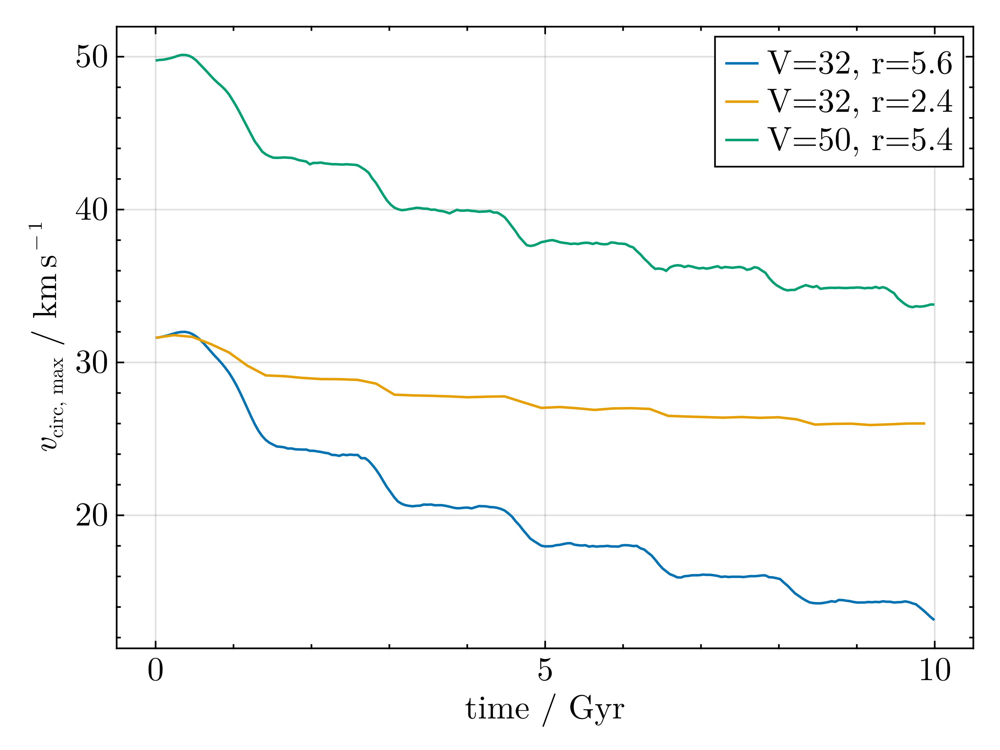

In [19]:
let
	fig, ax = FigAxis(
		xlabel="time / Gyr",
		ylabel = L"$v_\textrm{circ, max}$ / km\,s$^{-1}$"
	)


	for i in eachindex(profiles)
		
		vs = [p.v_circ_max for p in profiles[i].profiles]
		lines!(profiles[i].times * T2GYR, (vs * V2KMS), label=labels[i])
	end

	axislegend()
	fig
end

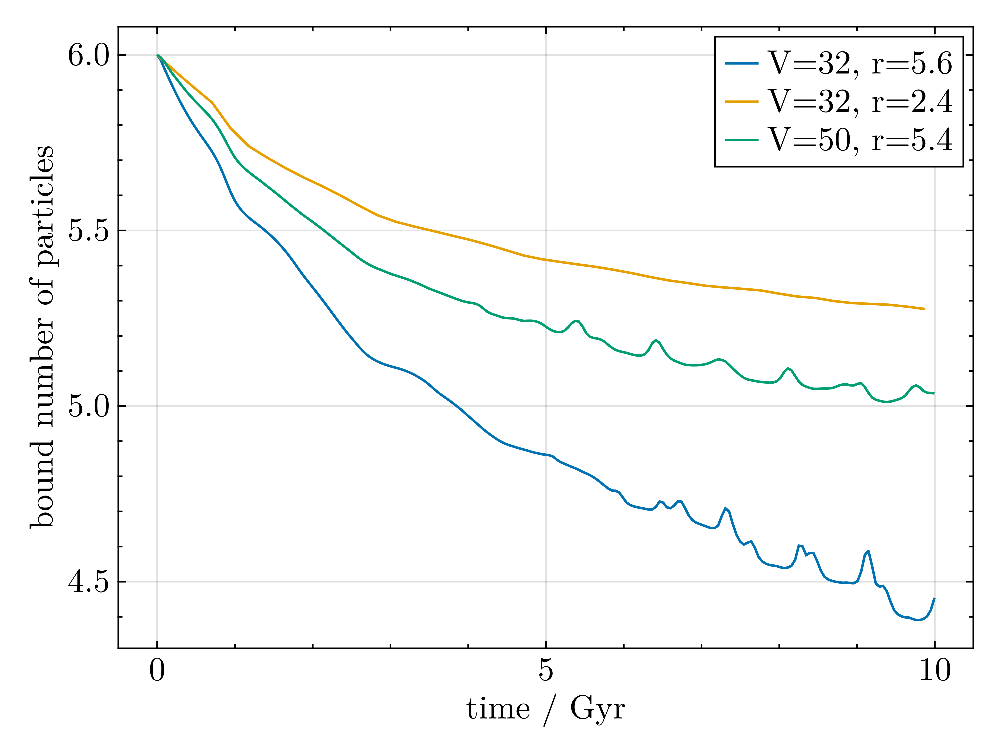

In [20]:
let
	fig, ax = FigAxis(
		xlabel="time / Gyr",
		ylabel = "bound number of particles",
	)

	for i in eachindex(profiles)
		
		vs = [p.N_bound for p in profiles[i].profiles]
		lines!(profiles[i].times * T2GYR, log10.(vs), label=labels[i])
	end

	axislegend()
	
	fig
end

In [ ]:
let
	fig, ax = FigAxis(
		xlabel=L"$\log\,r_\textrm{circ max}$ / kpc",
		ylabel = L"$\log\,v_\textrm{circ, max}$ / kpc",
	)

	for i in eachindex(profiles)
		profile = profiles[i]
		vs = [p.v_circ_max for p in profile.profiles]

		rs = [p.r_circ_max for p in profile.profiles]
		lines!(log10.(rs), log10.(vs * V2KMS), label=labels[i])
	end

	r = LinRange(1, 10, 100)
	v = 2π * r ./ (t_max_host /2)

	lines!(log10.(r), log10.(v * V2KMS), label=L"t=t_\textrm{max, host}/2", 
		color=:black, linestyle=:dot)

	axislegend(position=:rb)
	
	fig
end

In [ ]:
function t_max_of(prof)
	return 2π * prof.r_circ_max / prof.v_circ_max
end

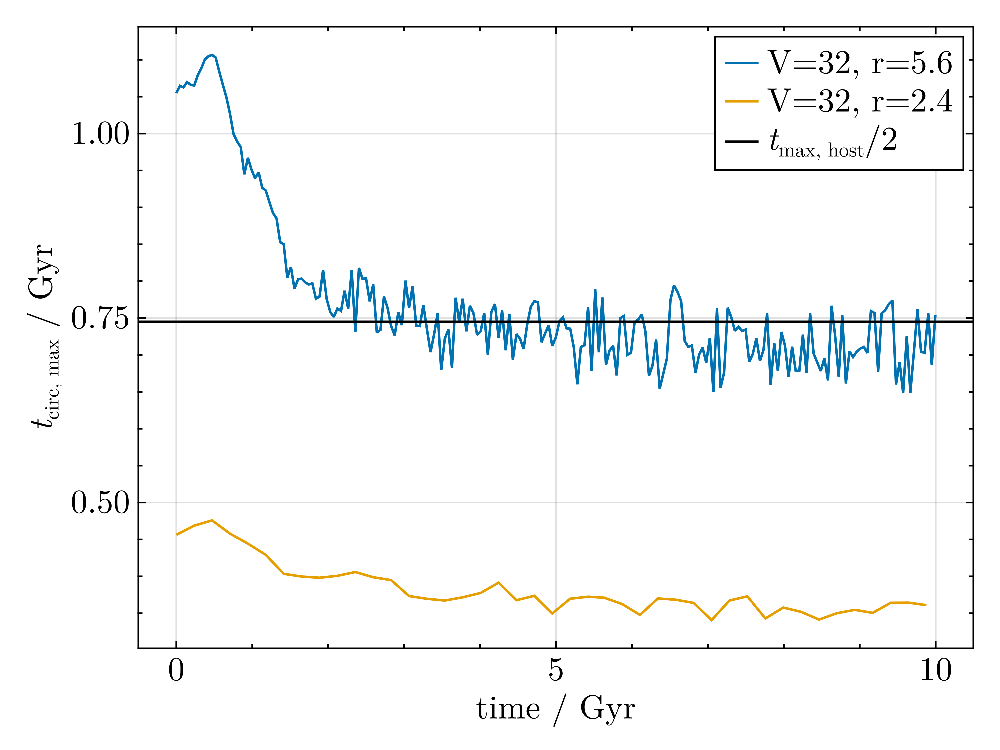

In [15]:
let
	fig, ax = FigAxis(
		xlabel="time / Gyr",
		ylabel = L"$t_\textrm{circ, max}$ / Gyr"
	)


	for i in eachindex(profiles)
		
		ts = t_max_of.(profiles[i].profiles)
		lines!(profiles[i].times * T2GYR, ts * T2GYR, label=labels[i])
	end

	hlines!(t_max_host * T2GYR / 2, color=:black, label=L"t_\textrm{max, host}/2")

	axislegend()
	fig
end

# Isolation

## Particle number

In [19]:
model_names = ["isolation/"] .* [
    "1e4/fiducial",
    "1e5/fiducial",
    "1e6/fiducial",
    #"1e7"
    ]
labels = [
    "1e4",
    "1e5",
    "1e6",
    "1e7"
    ]

profiles = load_profile.(model_names);

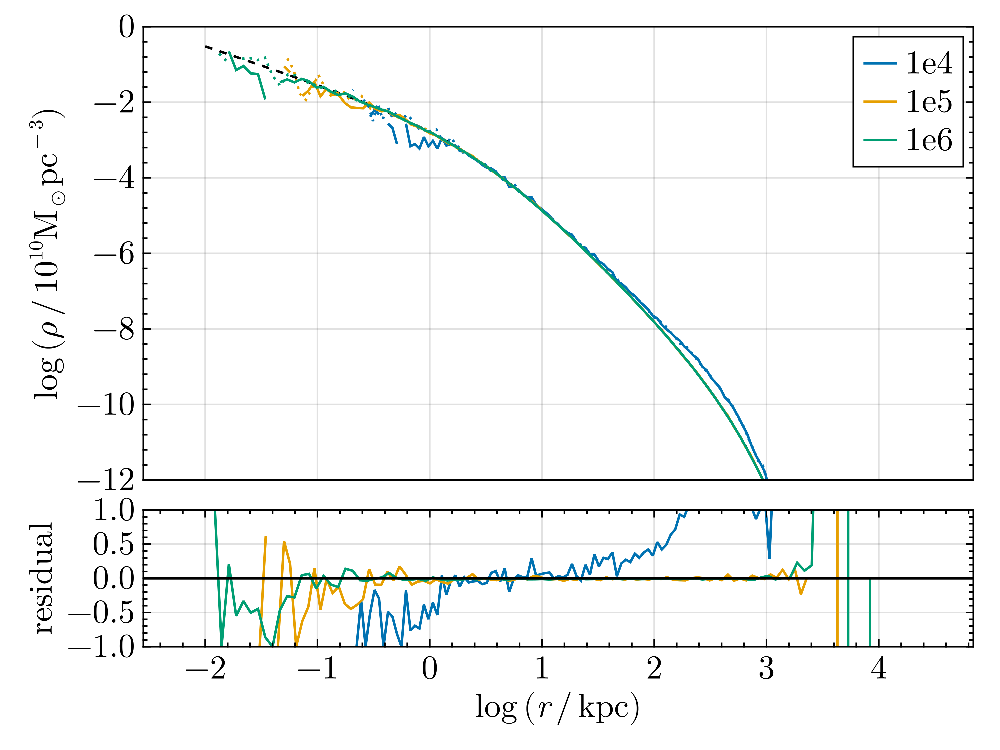

In [22]:
compare_densities(profiles, labels)

## 1e4

In [116]:
print_cpus_in_folder("isolation/1e4")

model       	cpu s/T0	%grav
------------	--------	--------
acc_0.001   	    1.40	97.8
acc_0.003   	    1.39	97.8
acc_0.1     	    1.37	97.5
default     	    1.31	97.0
dt_0.01     	   88.79	98.2
dt_0.03     	   22.14	98.1
dt_0.1      	    5.48	98.0
dt_0.3      	    2.79	97.8
dt_1        	    0.72	96.7
dt_10       	    0.10	94.5
dt_3        	    0.36	96.7
fiducial    	    1.93	97.9
fmm         	    1.80	97.9
s0.014      	    2.44	94.8
s0.44       	    1.39	97.3
s4          	    1.38	97.8
theta_0.01  	    6.78	99.4
theta_0.1   	    5.60	99.3
theta_1     	    0.46	92.8
thetarel_0.5	    0.63	94.4
treepm      	   26.96	99.8


In [151]:
model_names = ["isolation/"] .* [
    "1e4/s0.014",
    "1e4/s0.44",
    "1e4/default",
    "1e4/s4"
    ]

labels = [
    "0.014",
    "0.44",
    "1.4",
    "4"
    ]

profiles = load_profile.(model_names);

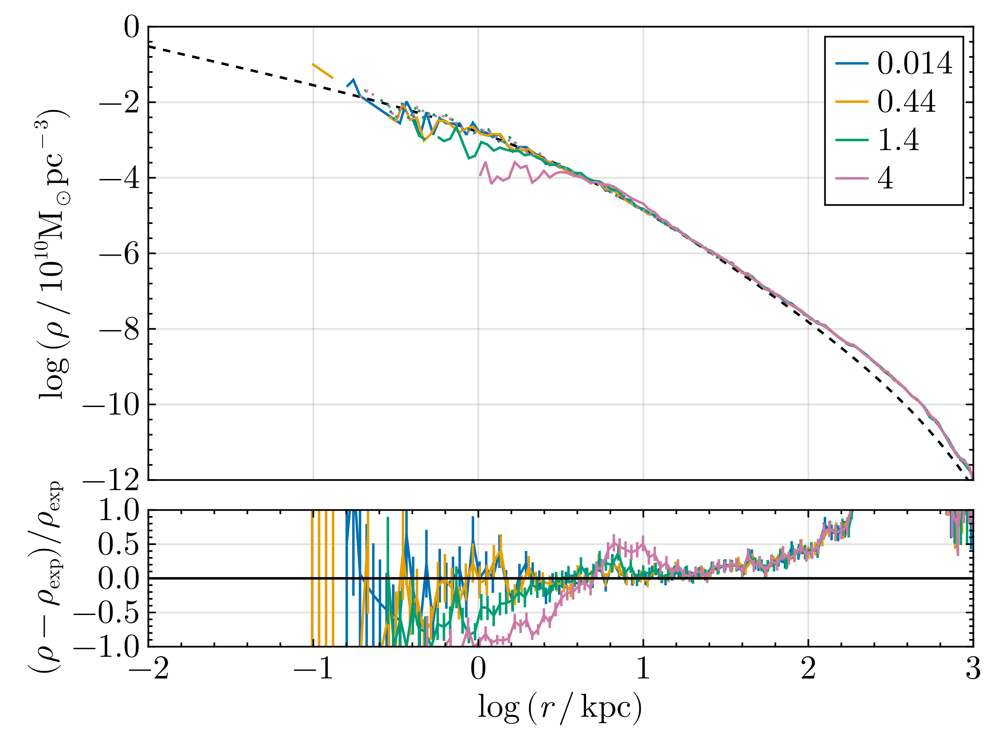

In [152]:
compare_densities(profiles, labels)

In [153]:
model_names = ["isolation/"] .* [
    "1e4/dt_0.01",
    "1e4/dt_1",
    "1e4/dt_10",
    "1e4/default",
    ]

labels = model_names
profiles = load_profile.(model_names);

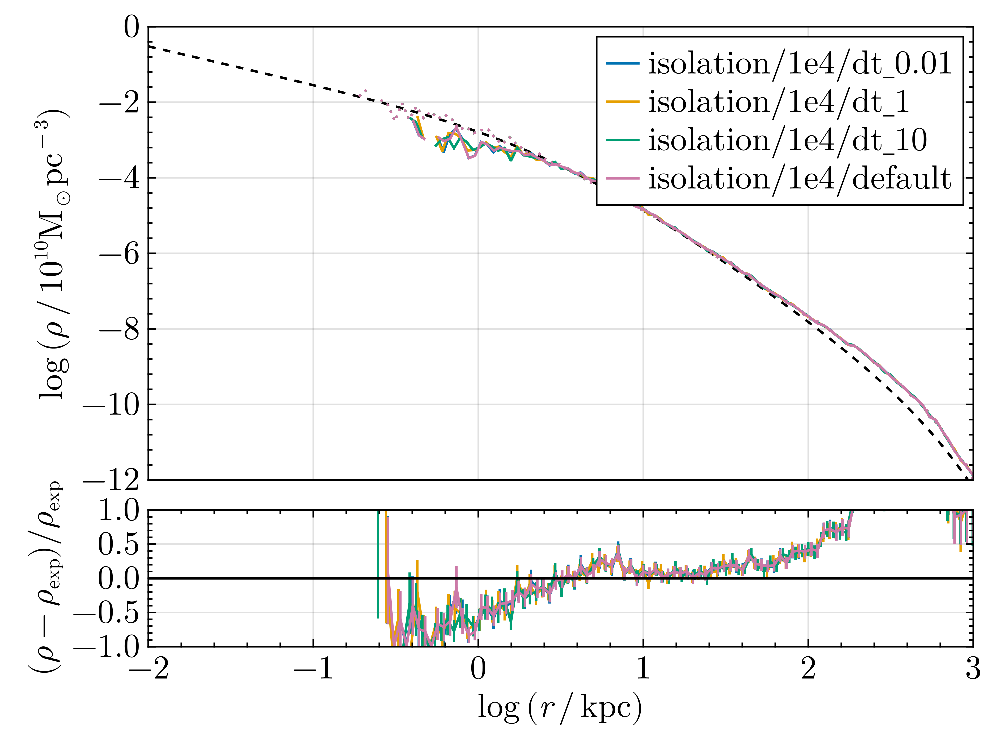

In [154]:
compare_densities(profiles, labels)

In [155]:
model_names = ["isolation/"] .* [
    "1e4/dt_0.01",
    "1e4/acc_0.001",
    "1e4/acc_0.003",
    "1e4/default",
    "1e4/acc_0.1",
    ]

labels = model_names
profiles = load_profile.(model_names);

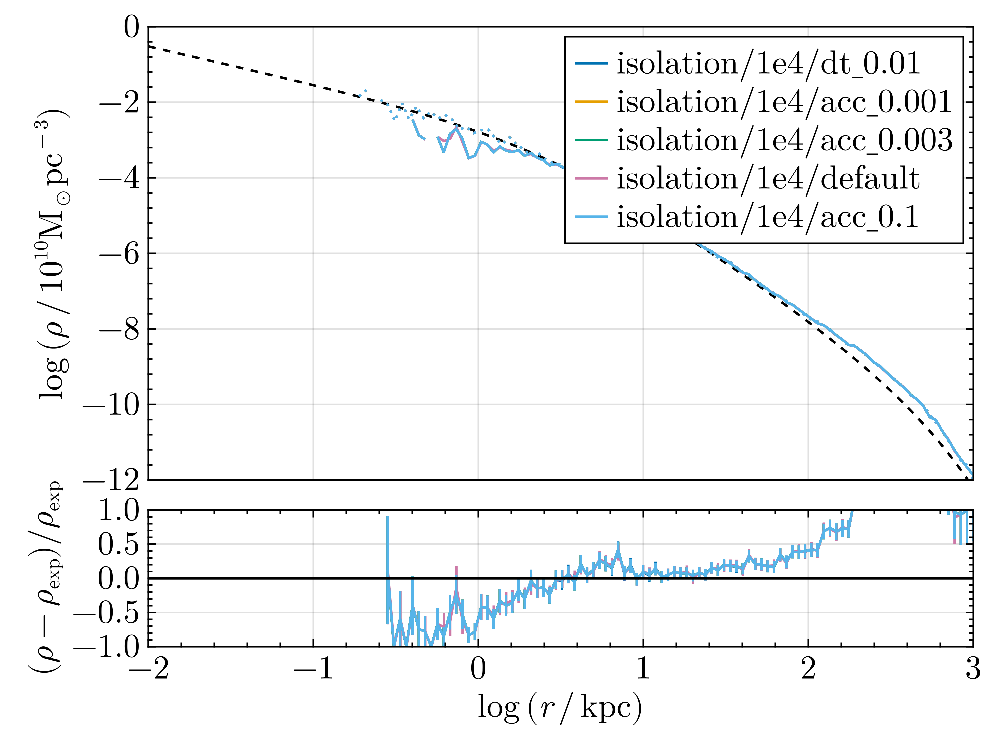

In [156]:
compare_densities(profiles, labels)

The above figure compares models using different relative timestepping criteria. The models perfectly converge around a parameter eta=0.003

### Gravitational force accuracy

In [157]:
model_names = ["isolation/"] .* [
    "1e4/theta_0.1",
    "1e4/default",
    "1e4/theta_1",
    ]

labels = model_names
profiles = load_profile.(model_names);

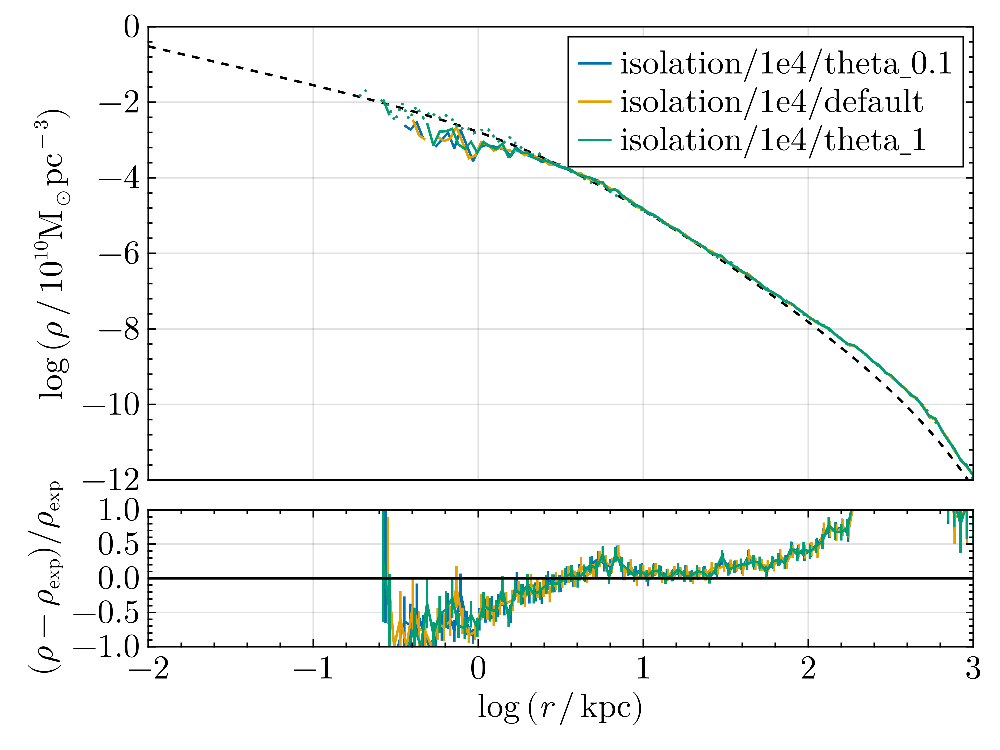

In [158]:
compare_densities(profiles, labels)

In [159]:
model_names = ["isolation/"] .* [
    "1e4/theta_0.01",
    "1e4/theta_0.1",
    "1e4/default",
    "1e4/thetarel_0.5",
    ]

labels = model_names
profiles = load_profile.(model_names);

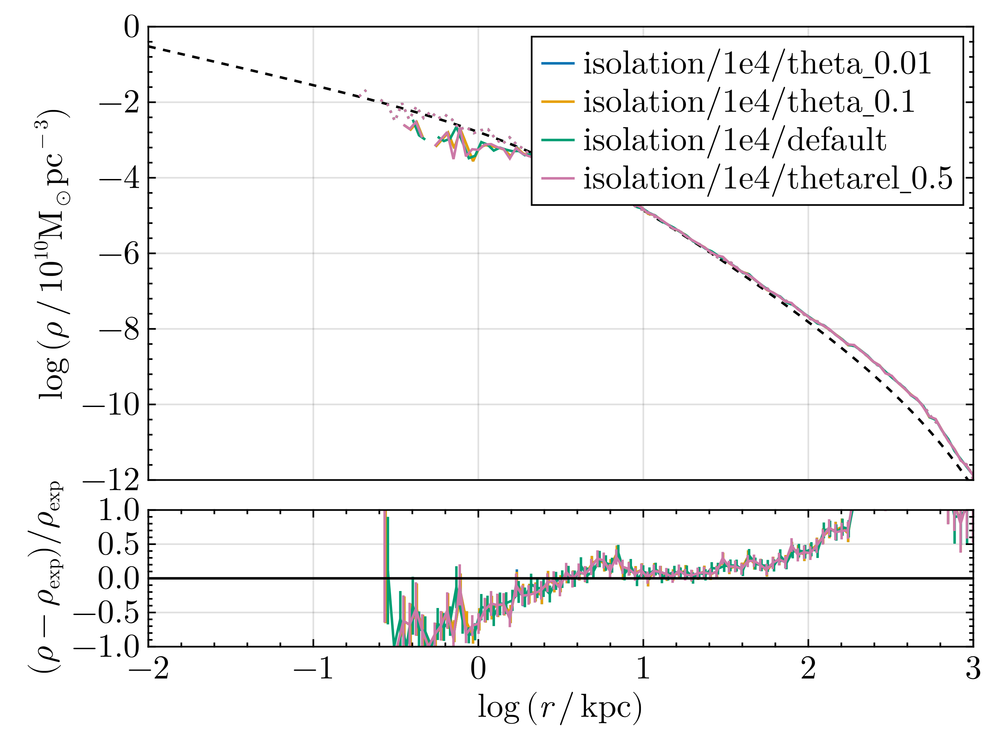

In [160]:
compare_densities(profiles, labels)

The models above compare different values of the gravitational opening criterion. Below a theta of 0.1, the models are perfectly converged here. 

### Gravity methods

In [161]:
model_names = ["isolation/1e4/"] .* [
    "dt_0.3",
    "treepm",
    "fmm",
    ]

labels = model_names
profiles = load_profile.(model_names);

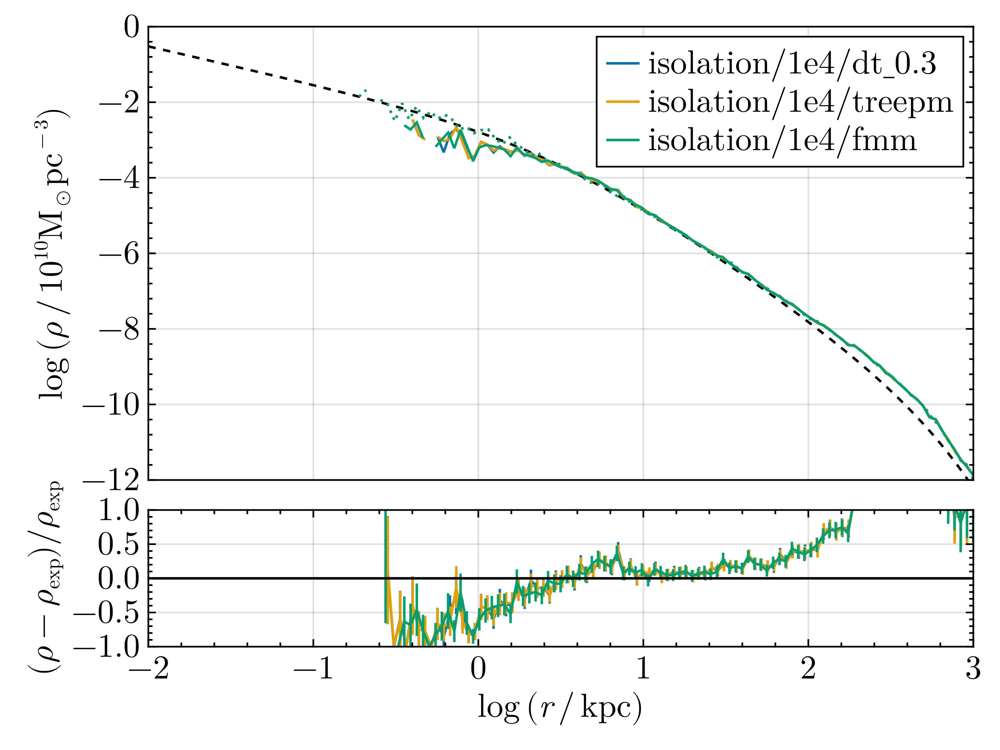

In [162]:
compare_densities(profiles, labels)

## 1e5

In [123]:
print_cpus_in_folder("isolation/1e5")

model     	cpu s/T0	%grav
----------	--------	--------
default   	    7.41	96.1
facc_0.001	   12.24	97.4
facc_0.015	    6.36	95.3
fiducial  	    9.57	95.9
s0.014    	   12.91	91.3
s0.044    	    8.94	93.5
s0.44     	    7.61	95.9
s1.4      	    7.89	96.1


In [124]:
model_names = ["isolation/1e5/"] .* [
    "s1.4",
    "s0.44",
    "default",
   #"fiducial",
    "s0.044",
    "s0.014",
    ]

labels = model_names
profiles = load_profile.(model_names);

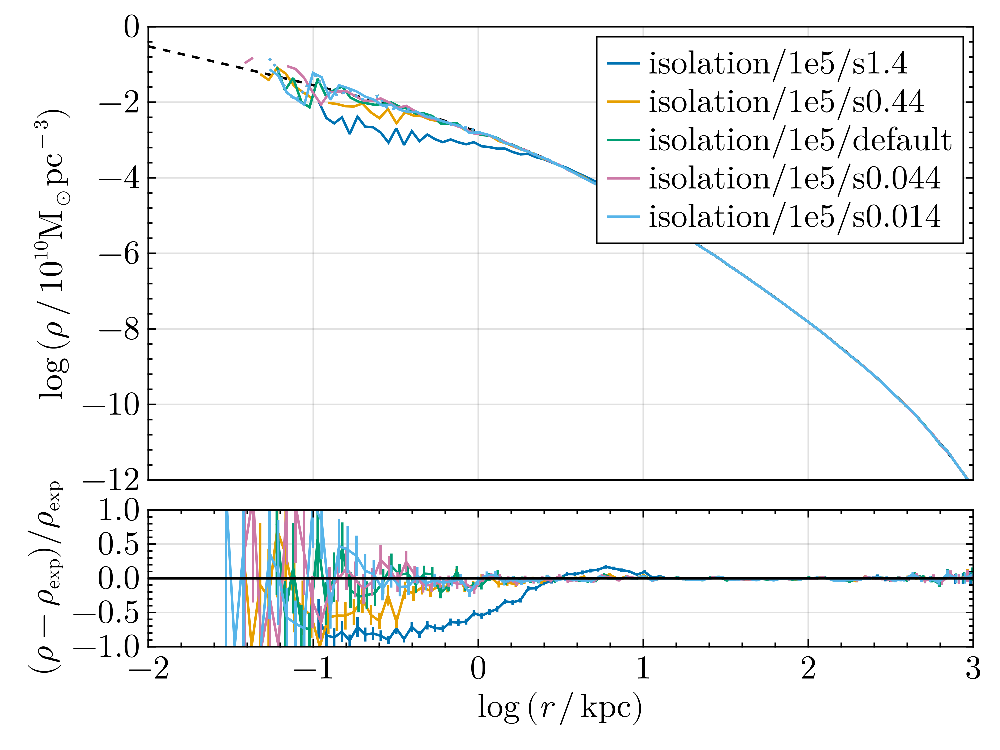

In [125]:
compare_densities(profiles, labels)

In [126]:
model_names = ["isolation/1e5/"] .* [
    "facc_0.015",
    "default",
   #"fiducial",
    "facc_0.001",
    ]

labels = model_names
profiles = load_profile.(model_names);

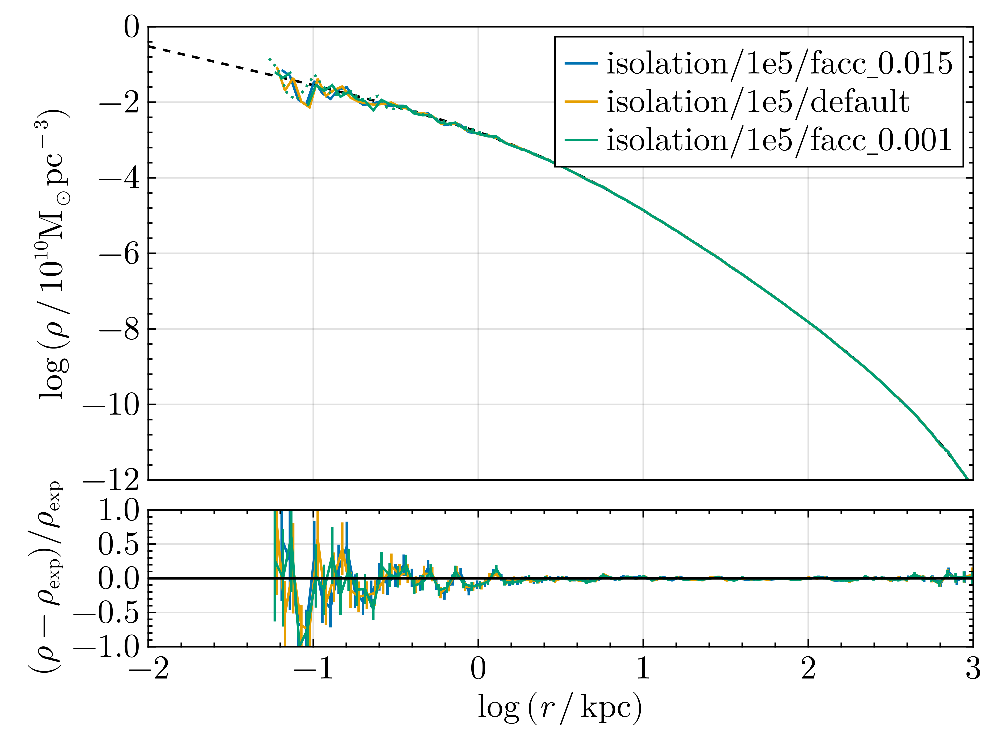

In [127]:
compare_densities(profiles, labels)

## 1e6

In [24]:
print_cpus_in_folder("isolation/1e6")

model   	cpu s/T0	%grav
--------	--------	--------
fiducial	  295.54	83.8
s0.014  	  358.39	81.8
s0.14   	  199.46	85.5


In [80]:
profiles = [
    "s=0.014" => load_profile("isolation/1e6/s0.014"),
    "s=0.044" => load_profile("isolation/1e6/fiducial"),
    "s=0.14" => load_profile("isolation/1e6/s0.14"),
    ];

In [ ]:
compare_densities(profiles)

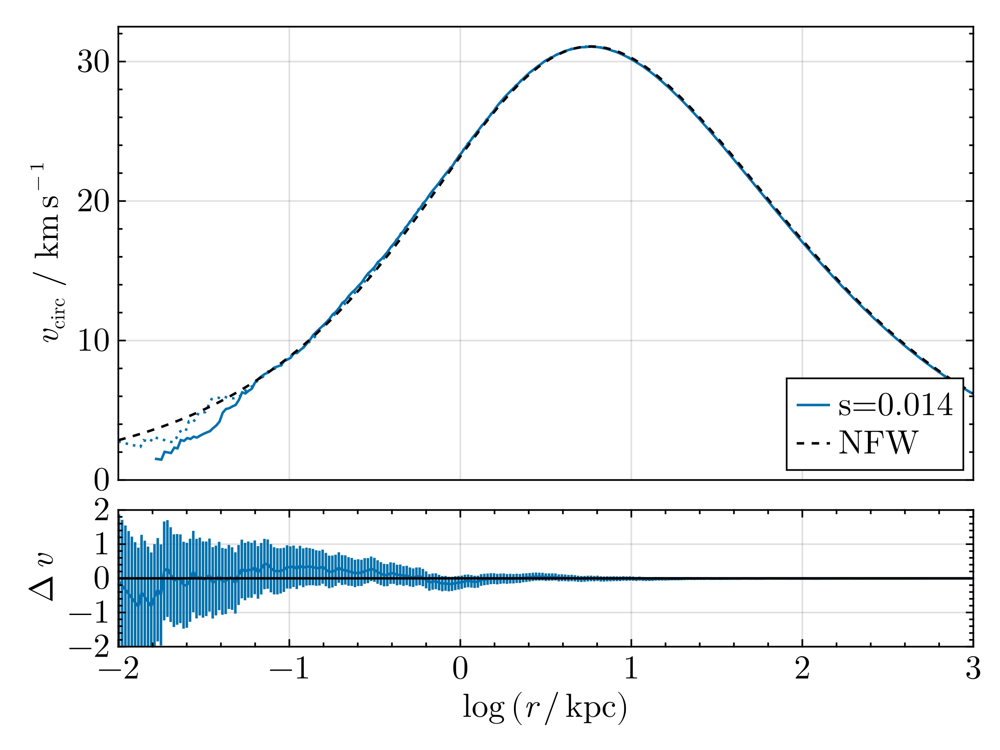

In [51]:
compare_vcirc(profiles)

In [25]:
compare_t_dyn(profiles, labels)

LoadError: type Pair has no field log_r

## Halo generation methods

In [30]:
model_names = ["isolation/"] .* [
    "1e6/fiducial",
    "1e6_gspmodel",
    "1e6_gsprealize",
    ]

3-element Vector{String}:
 "isolation/1e6/fiducial"
 "isolation/1e6_gspmodel"
 "isolation/1e6_gsprealize"

In [26]:
profiles = load_profile.(model_names);

In [27]:
labels = [
    "agama",
    "gspmodel",
    "gsprealize",
    ]

3-element Vector{String}:
 "agama"
 "gspmodel"
 "gsprealize"

In [30]:
compare_densities(profiles)

LoadError: MethodError: no method matching iterate(::LilGuys.MassProfile3D)

[0mClosest candidates are:
[0m  iterate([91m::Parameters.Lines[39m)
[0m[90m   @[39m [36mParameters[39m [90m~/.julia/packages/Parameters/MK0O4/src/[39m[90m[4mParameters.jl:78[24m[39m
[0m  iterate([91m::Parameters.Lines[39m, [91m::Any[39m)
[0m[90m   @[39m [36mParameters[39m [90m~/.julia/packages/Parameters/MK0O4/src/[39m[90m[4mParameters.jl:78[24m[39m
[0m  iterate([91m::Base.AsyncCollector[39m, [91m::Base.AsyncCollectorState[39m)
[0m[90m   @[39m [90mBase[39m [90m[4masyncmap.jl:315[24m[39m
[0m  ...


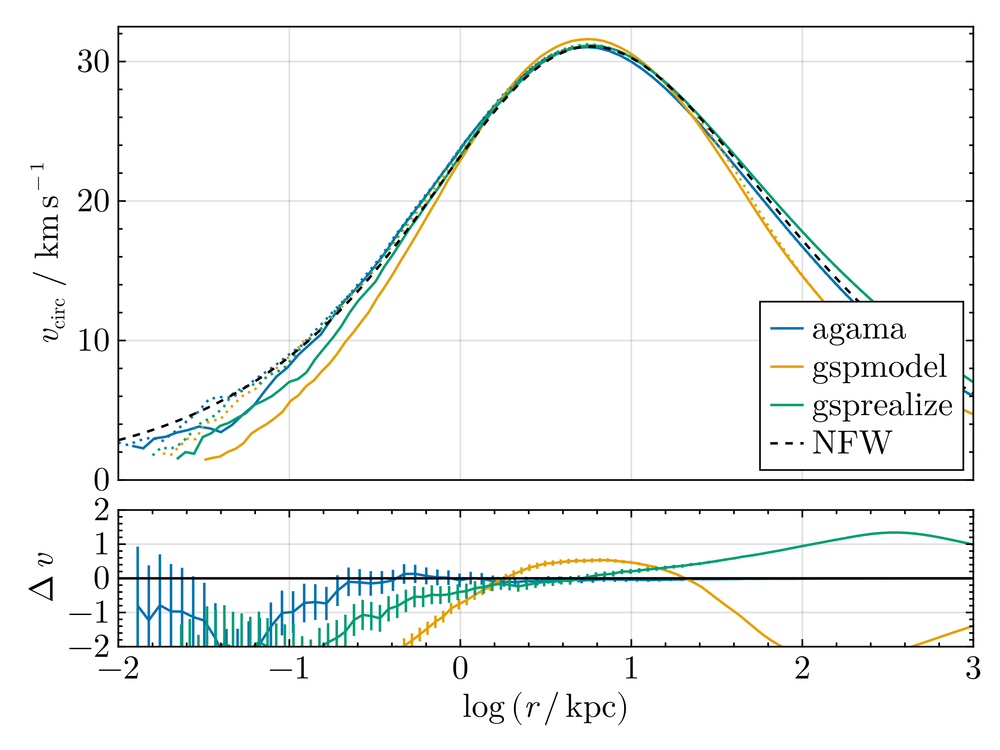

In [94]:
compare_vcirc(profiles, labels)

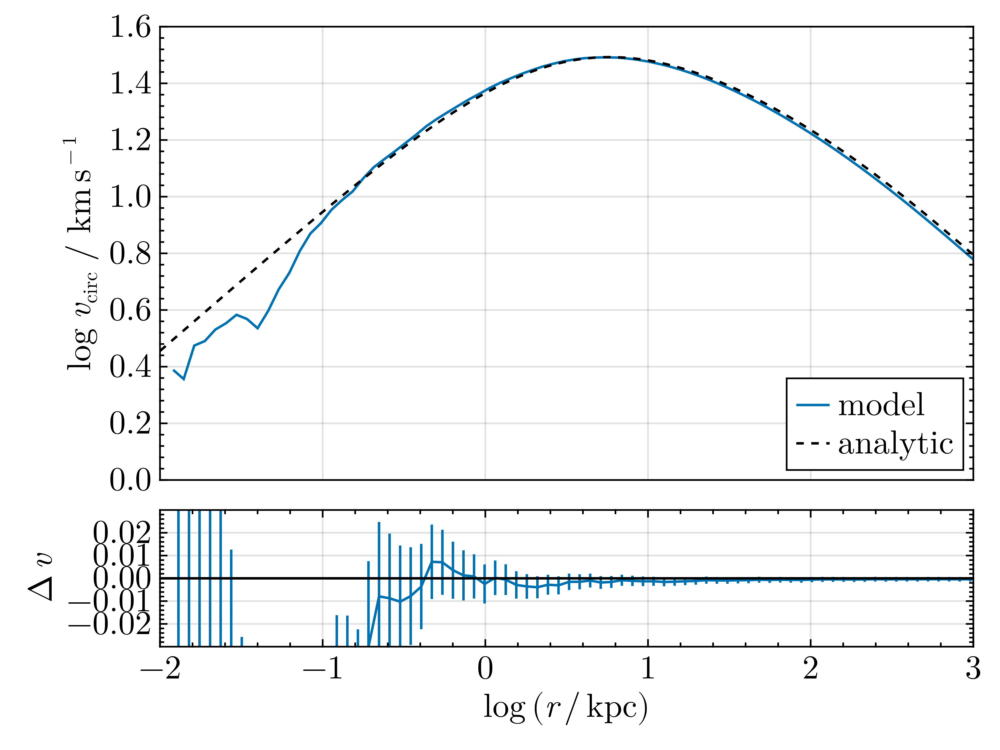

In [124]:
compare_vcirc1(profiles[1][end], res_limits=0.03)

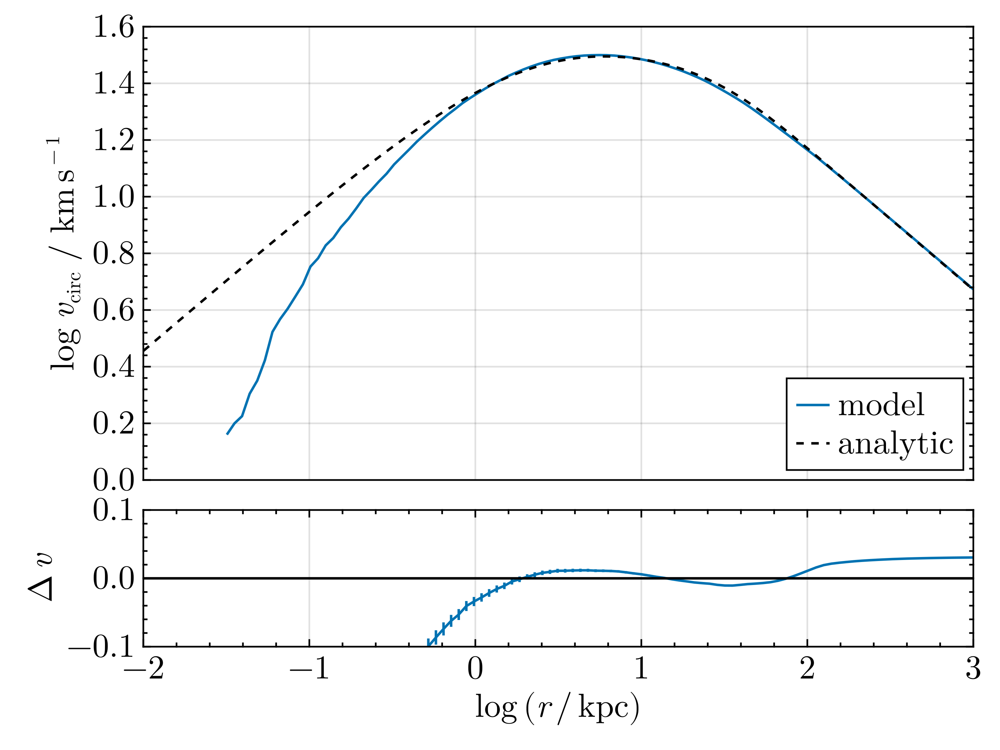

In [123]:
compare_vcirc1(profiles[2][end], NFWZeno(m_a=halo.M_s * LilGuys.A_NFW(1), a=halo.r_s, b=halo.r_s * 2))

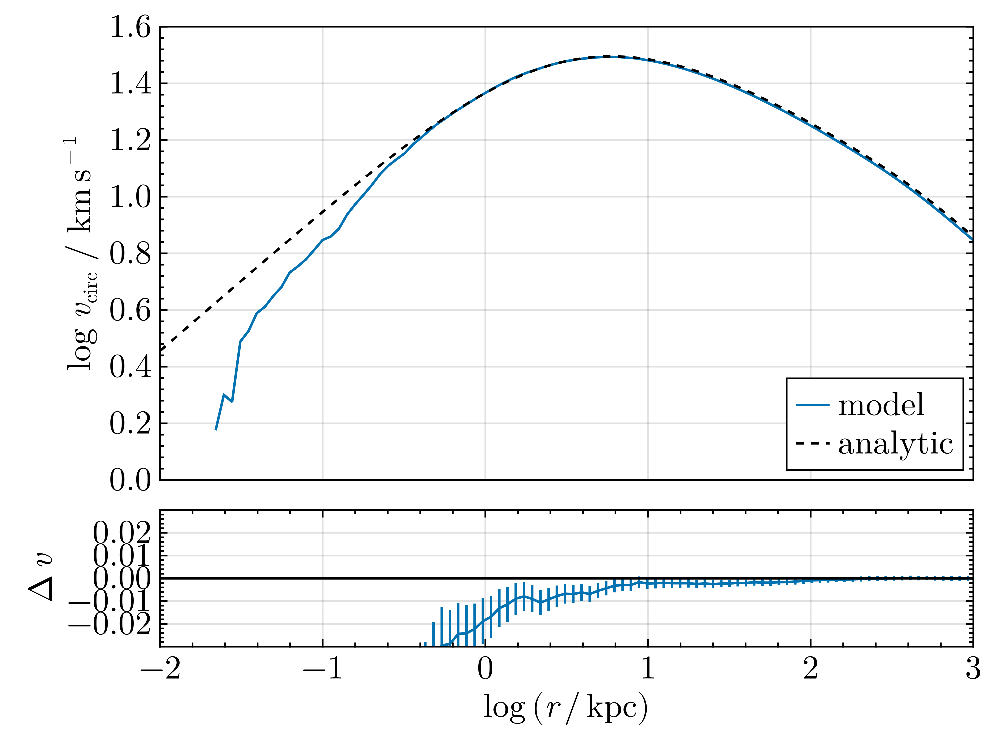

In [121]:
compare_vcirc1(profiles[3][end], NFWZeno(m_a=halo.M_s * LilGuys.A_NFW(1), a=halo.r_s, b=halo.r_s * 64), res_limits=0.03)

# 1e7

In [57]:
print_cpus_in_folder("isolation/1e7")

model   	cpu s/T0	%grav
--------	--------	--------
fiducial	 2482.67	91.6
s0.014  	 2433.26	91.4


In [58]:
model_names = ["isolation/1e7/"] .* [
    "fiducial",
    "s0.014",
    ]

2-element Vector{String}:
 "isolation/1e7/fiducial"
 "isolation/1e7/s0.014"

In [66]:
profiles = [
    "fiducial" => load_profile("isolation/1e7/fiducial"),
    "s=0.014" => load_profile("isolation/1e6/s0.014")
    ];

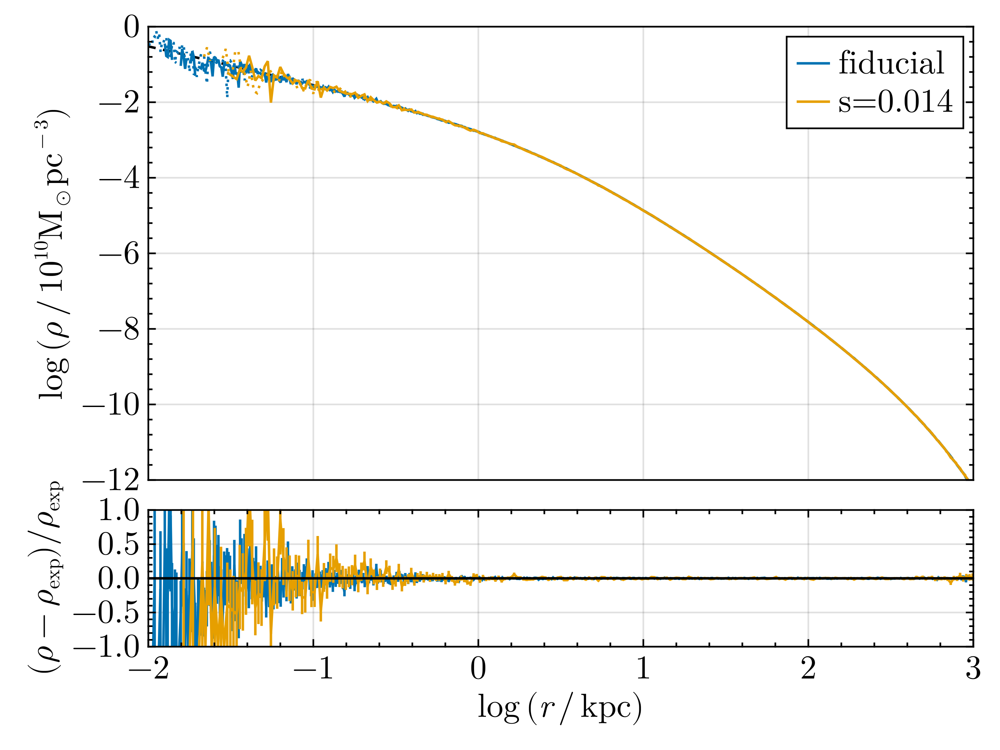

In [79]:
compare_densities(profiles)

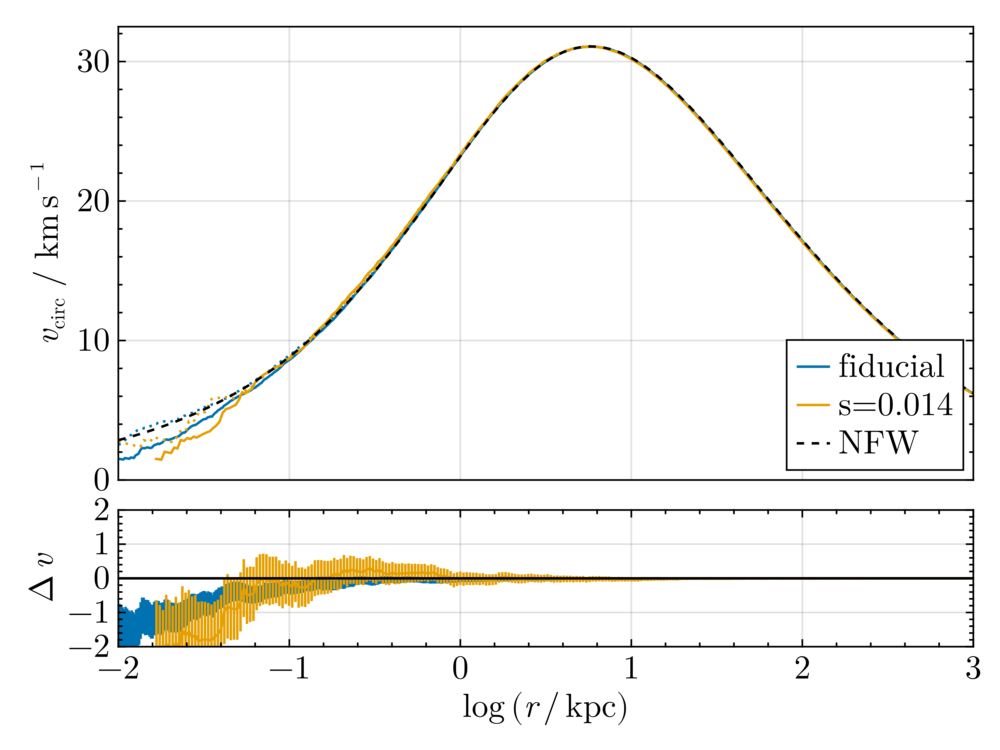

In [73]:
compare_vcirc(profiles)